# Web自动化测试技术之Selenium

## Web端自动化测试

1. 极高的效率执行
2. 完成复杂的业务场景
3. 记录和调试网页的细节

---

## Selenium自动化环境搭建

### 详解整套配置

#### 准备python环境

推荐大家使用anaconda配置python环境。

<img src="./pictures/%E6%88%AA%E5%B1%8F2022-09-18%2009.55.41.png" width = "800"  alt="anaconda环境" 
align=center>


#### 下载selenium并安装

In [ ]:
!pip install selenium

'''
如果采用anaconda虚拟环境，则需要在cmd(windows)或者终端(macOS)中

!conda activate XXX
!pip install selenium
'''

#### 安装浏览器和浏览器驱动

参考 https://www.selenium.dev/zh-cn/documentation/webdriver/getting_started/install_drivers/ 中的教程，以普遍使用的Google Chrome为例

1. 进入该网页 https://chromedriver.chromium.org/downloads，根据对应chrome版本下载驱动。
   1. 查看chrome版本 
      
      1. 在设置中查看
         
         <img src="./pictures/%E6%88%AA%E5%B1%8F2022-09-18%2010.13.18.png" width = "600"  alt="anaconda环境" align=center>
      2. 在Chrome中键入 chrome://version/ 查看

         <img src="./pictures/截屏2022-09-18 10.55.32.png" width = "600"  alt="anaconda环境" align=center>
   2. 下载对应驱动

       <img src="./pictures/截屏2022-09-18 10.16.19.png" width = "600"  alt="anaconda环境" align=center>

2. 设置浏览器驱动路径
   1. macOS : Finder >> Shift+⌘+G >> 输入 /usr/local/bin/chromedriver >> Enter，将下载解压后的chromedriver拖到该处。
   2. win : 将下载解压后的文件拖到特定文件夹（避免以后更新的时候找不到），添加文件夹路径到 控制面板\系统和安全\系统\高级系统设置\环境变量 的PATH中，以防万一可以全局变量和用户变量均添加

      <img src="./pictures/截屏2022-09-18 11.01.03.png" width = "300"  alt="anaconda环境" align=center>
   
   3. 也可以不进行上两步，***拿本本记下解压后chromedriver的路径***，如果你真的很懒，或者只想尝试尝试selenium，甚至可以将它放在"下载"文件夹中。

#### Jupyter notebook

这个东西不是必须的，不过用它来做实验会比较方便。并且如果你愿意忙活的话，可以去租一台有外网IP的服务器，这样就可以开放8888或者8889端口，能够远程访问你的jupyter notebook。

#### IDE等工具介绍

在PC端，我一般使用Vscode和Pycharm，很少使用浏览器进行jupyter notebook的编辑。

在iPad端，Pythonista太弱。Juno是iPad上最好的的Jupyter notebook（甚至可以说的python）的编辑器。如果你有上面一条中的服务器，你也可以尝试Juno Connect，它的界面十分优美。



### Docker启动虚拟环境

#### Docker完成环境建立

优点：适用Windows、MacOS、CentOS等多种操作系统，并且一般不会因为系统不同报错。环境建立仅需几条命令。

1. 下载我的文件夹，其中包含DockerFile文件
2. 各系统配置各自的Docker环境 https://www.docker.com/ （下载完，基本不需要什么操作）
3. 启动Docker，注册，登录用户（否则无法连接hub下载镜像）
   
     <img src="./pictures/截屏2022-09-20 16.13.25.png" width = "600"  alt="anaconda环境" align=center>
4. 打开终端
5. 输入命令，进入1步骤中解压的根目录，例如：```cd users/creative/python/selenium ```
6. 输入命令， ```docker build -f $(pwd)/DockerFile  -t jupyter-selenium .```，建立虚拟环境
7. 输入命令， ```docker run -it -v $(pwd)/work:/home/jovyan/work -p 8888:8888 --name jupyter-selenium jupyter-selenium```，启动容器
8. 在终端中，可以看到
          
      <img src="./pictures/截屏2022-09-20 16.18.40.png" width = "600"  alt="anaconda环境" align=center>
      
9. 将上图其中一条网址复制到浏览器中打开，进入notebook，运行程序。

---

In [104]:
from selenium import webdriver
from selenium.webdriver.chrome.options import Options

In [105]:
from IPython.display import Image
import os
import time

#### options常用属性及方法为：

1. binary_location=''：指定Chrome浏览器路径
2. debuger_address='：指定调试路径
3. headless: 无界面模式
4. add_argument()：添加启动参数
5. add_extension：添加本地插件
6. add_experimental_option：添加实验选项
7. to_capabilities：将options转为标准的capablitiies格式


##### 通过add_argument()添加属性
通过add_argument()可以添加启动参数，如初始化窗口尺寸，隐身模式等。

1. 设置无头浏览器：从而使得浏览器在不显示图形界面的情况下，通过编程来控制自动执行各种任务，比如做测试，给网页截屏等。

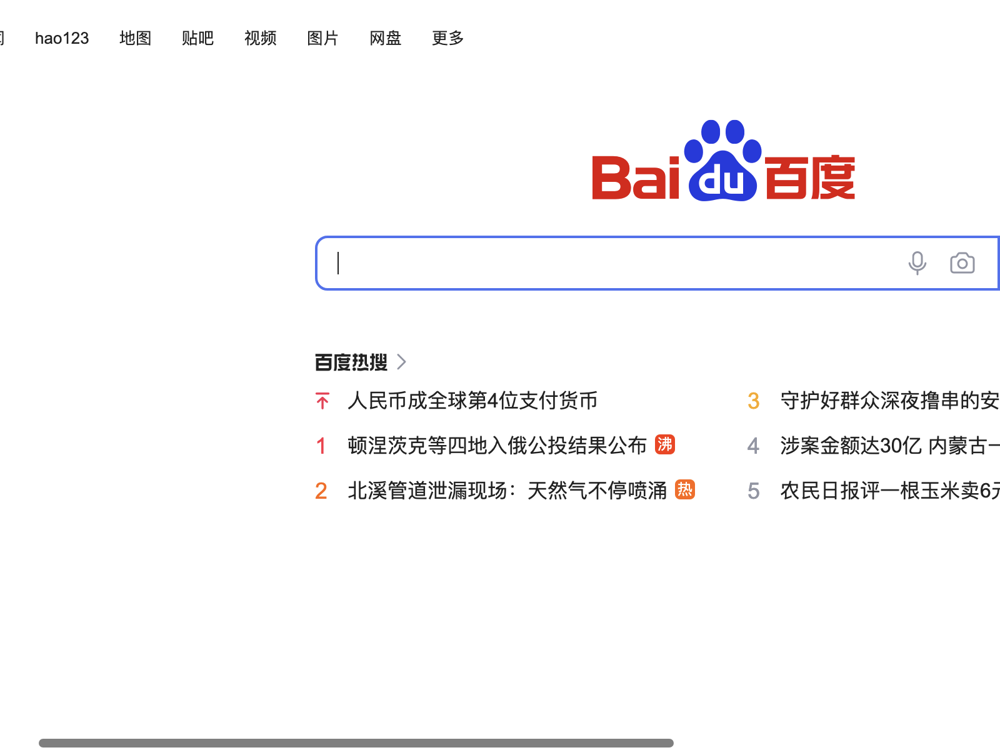

In [106]:
options = Options()
options.add_argument('headless')   
driver = webdriver.Chrome(options=options)
driver.get("http://www.baidu.com")
driver.save_screenshot('screenshot_google.png')
time.sleep(3)
driver.close()
Image("screenshot_google.png",width=300)

2. 设置chrome浏览器位置

In [107]:
## 打开浏览器
options = Options()
## 如果使用的是docker虚拟环境，设置google-chrome路径
if os.path.exists('/usr/bin/google-chrome'):
    options.binary_location = '/usr/bin/google-chrome'
driver = webdriver.Chrome(options=options)
agent = driver.execute_script("return navigator.userAgent")   
print(f'user-agent 为 {agent}')
driver.close()

user-agent 为 Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/105.0.0.0 Safari/537.36


3. 设置user-agent：指定用户客户端-模拟手机浏览

In [108]:
options = Options()
options.add_argument('user-agent="MQQBrowser/26 Mozilla/5.0 (Linux; U; Android 2.3.7; zh-cn; MB200 Build/GRJ22; CyanogenMod-7) AppleWebKit/533.1 (KHTML, like Gecko) Version/4.0 Mobile Safari/533.1"')
driver = webdriver.Chrome(options=options)
agent = driver.execute_script("return navigator.userAgent")   
print(f'user-agent 为 {agent}')
driver.close()

user-agent 为 "MQQBrowser/26 Mozilla/5.0 (Linux; U; Android 2.3.7; zh-cn; MB200 Build/GRJ22; CyanogenMod-7) AppleWebKit/533.1 (KHTML, like Gecko) Version/4.0 Mobile Safari/533.1"


4. 设置代理：绕开反爬策略

In [109]:
options = Options()
options.add_argument("--proxy-server=http://120.194.55.139:6969")
driver = webdriver.Chrome(options=options)
driver.get("http://httpbin.org/ip")
print(driver.page_source)  
driver.close()

<html><head><meta name="color-scheme" content="light dark"></head><body><pre style="word-wrap: break-word; white-space: pre-wrap;">{
  "origin": "120.194.55.139"
}
</pre></body></html>


5. 隐私模式，禁止图片加载

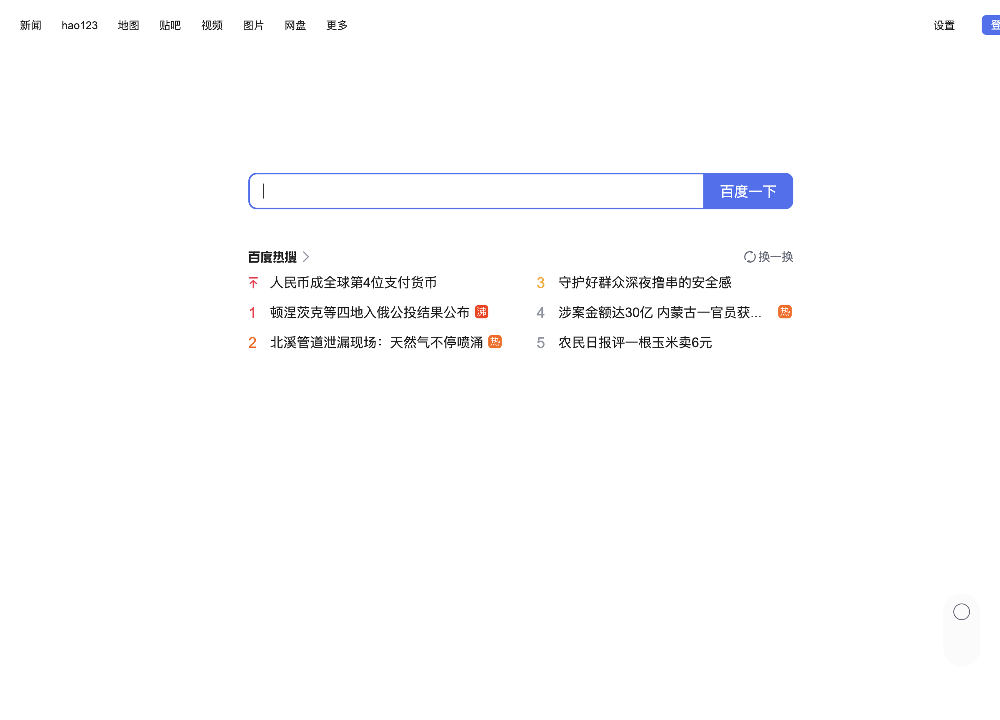

In [110]:
options = Options()
options.add_argument('incognito')
options.add_argument('blink-settings=imagesEnabled=false')
driver = webdriver.Chrome(options=options)
driver.get("http://www.baidu.com")
driver.save_screenshot('screenshot_google.png')
time.sleep(3)
driver.close()
Image("screenshot_google.png",width=300)

5. 还有许多options（查看源代码）[Mac: ⌘+Click]
    ```python
    # 自动打开开发者工具
    options.add_argument("auto-open-devtools-for-tabs")

    # 设置窗口尺寸，注意宽高之间使用逗号而不是x
    options.add_argument('window-size=300,600')

    # 设置窗口启动位置（左上角坐标）
    options.add_argument('window-position=120,0')

    # 禁用gpu渲染
    options.add_argument('disable-gpu')

    # 全屏启动
    options.add_argument('start-fullscreen')

    # 全屏启动，无地址栏
    options.add_argument('kiosk') 

    # 启动时，不激活（前置）窗口
    options.add_argument('no-startup-window')
    ```

#### 通过add_extension添加拓展应用

In [113]:
options = Options()
# options.add_argument('kiosk')
options.add_extension('Downie.crx')
# options.add_argument("proxy-server=http://202.20.16.82:10152")
driver = webdriver.Chrome(options=options)

In [114]:
driver.close()

#### 通过add_experimental_option添加实验选项


In [115]:
options = Options()
prefs = {} 
# 设置这两个参数就可以避免密码提示框的弹出
prefs["credentials_enable_service"] = False 
prefs["profile.password_manager_enabled"] = False 
options.add_experimental_option("prefs", prefs) 
driver = webdriver.Chrome(chrome_options=options) 
driver.get('https://www.baidu.com/')

/Users/creative/opt/anaconda3/envs/statistics/lib/python3.7/site-packages/ipykernel_launcher.py:7: DeprecationWarning: use options instead of chrome_options
  import sys


In [116]:
driver.close()

---

## 元素查找
### HTML标签和属性

```<p class="greeting"><font size="5" color="red">Hello, World!</font></p>```

<p class="greeting"><font size="5" color="red">Hello, World!</font></p>

一般形式： <标签名 属性名1="属性值" 属性名2="属性值" ... 属性名N="属性值">内容</标签名>

HTML属性一般都出现在HTML标签中，HTML属性是HTML标签的一部分。
1. 标签可以有属性，它包含了额外的信息，属性的值一般要在引号中
2. 标签可以拥有一个或多个属性，也可以没有属性；
3. 属性一般由属性名和值成对出现。

<img src="./pictures/element.gif" width = "400"  alt="anaconda环境" align=center>

### 元素定位失败原因

1. 元素没有加载完成
2. 元素不可用、读、见
3. 动态属性 动态的Div类

#### 定位方法

1. id
2. name
3. class_name
4. xpath
5. tag_name
6. link_text
7. partail_link_text
8. css_selector

### Selenium的定位方法
#### find_element & find_elements
```python
(method)find elements:(by:str By.ID,value:Any | None,None)->List [WebElement]

(method)find_element:(by:str By.ID,value:Any | None, None)->WebElement
```

In [119]:
## ⬇️ 设置无头浏览器，即不显示的浏览器。我可以通过编程来控制无头浏览器自动执行各种任务，比如做测试，给网页截屏等。 
## 也是最为常用的参数
options = Options()
options.add_argument('--headless')

In [120]:
## 不使用沙盒，为运行中的程序提供的隔离环境。通常是作为一些来源不可信、具破坏力或无法判定程序意图的程序提供实验之用。考虑到访问的网站比较安全，并且docker环境的要求，取消沙盒保护。
options.add_argument('--no-sandbox')
options.add_argument('--disable-gpu')
driver = webdriver.Chrome(options=options)

In [121]:
'''
需要用到的函数
'''
from selenium.webdriver.common.by import By 

***提前注意的点***

在Selenium3.\*中，允许使用find_element_by_XXXXXX的函数实现HTML中元素的查找，但是 Selenium4.0 中已经完全废除了该类函数，即使依然使用 3.\*版本，依旧建议使用 find_element函数加上 By.XXX 的方法

#### 通过ID定位

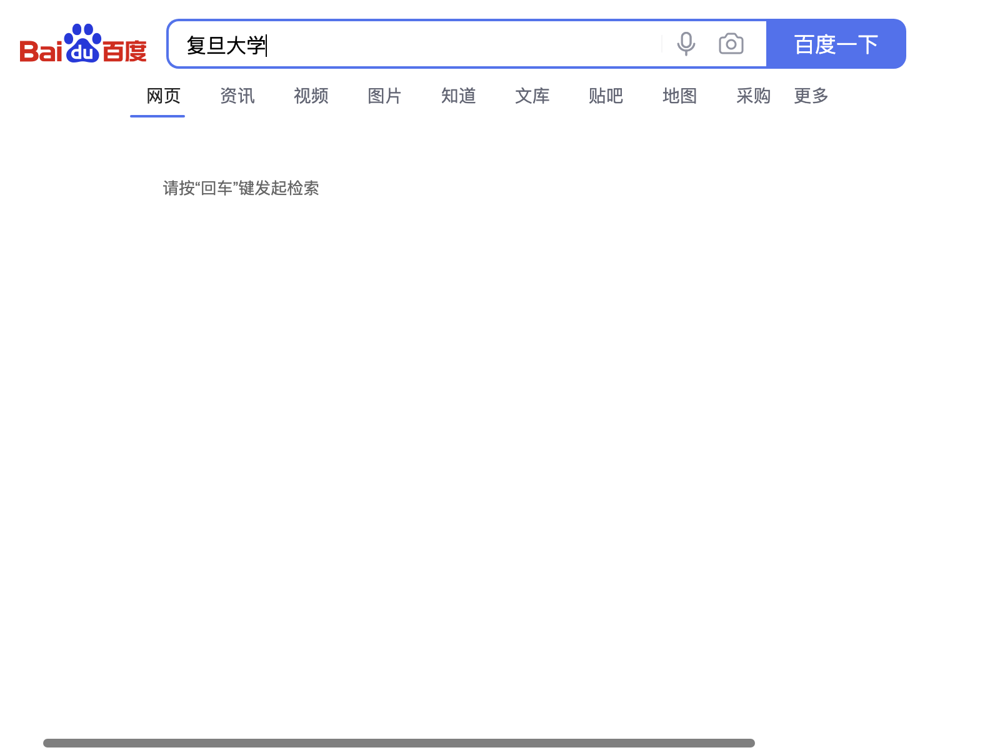

In [122]:
## 加载网页
driver.get("http://www.baidu.com")
## 定位元素，设置值
driver.find_elements(By.ID,"kw")[0].send_keys("复旦大学")
## 展示
driver.save_screenshot('screenshot_google.png')
Image("screenshot_google.png",width=800)

#### 通过name定位

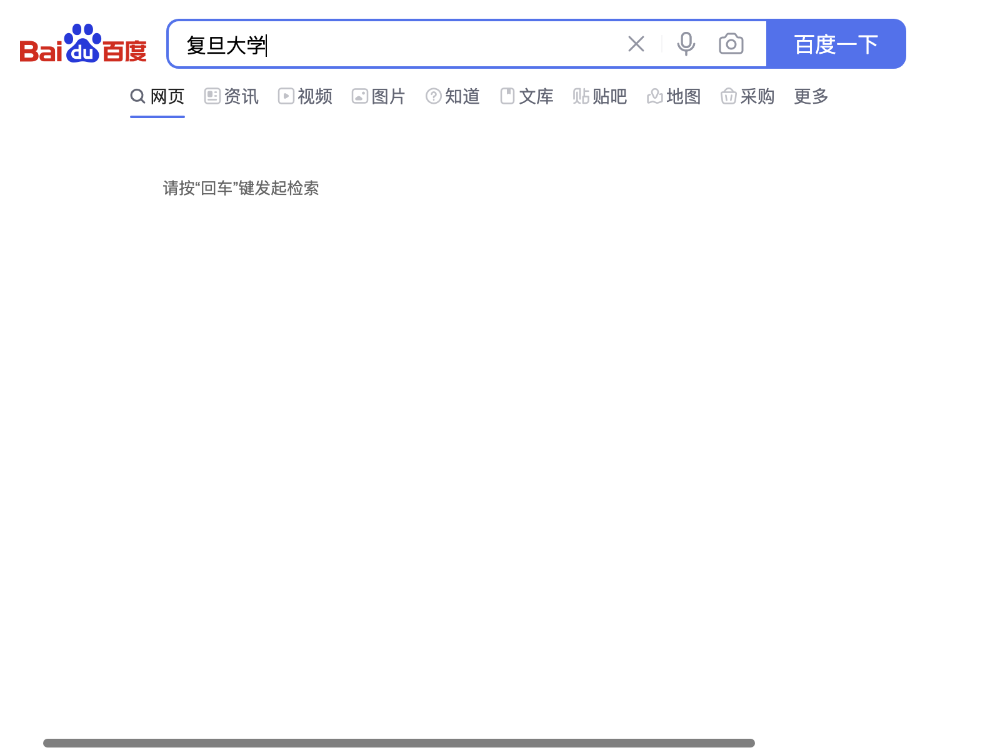

In [123]:
## 加载网页
driver.get("http://www.baidu.com")
## 定位元素，设置值
driver.find_element(By.NAME,"wd").send_keys("复旦大学")
driver.save_screenshot('screenshot_google.png')
Image("screenshot_google.png",width=800)

#### 通过class_name定位

class属性中间的空格并不是空字符串，那是间隔符号，表示的是一个元素有多个class的属性名称，class属性是比较特殊的一个，除了class这个元素类型有多个属性外，其他的像name，id是没多个属性的。

In [124]:
driver.get("http://www.baidu.com")
elements = driver.find_elements(By.CLASS_NAME, "mnav c-font-normal c-color-t")
elements

[]

In [125]:
driver.get("http://www.baidu.com")
elements = driver.find_elements(By.CLASS_NAME, "mnav.c-font-normal.c-color-t")
for element in elements:
    print(element.text)
elements[0].click()
windows = driver.window_handles
driver.switch_to.window(windows[-1])
driver.save_screenshot('screenshot_google.png')

新闻
hao123
地图
贴吧
视频
图片
网盘


True

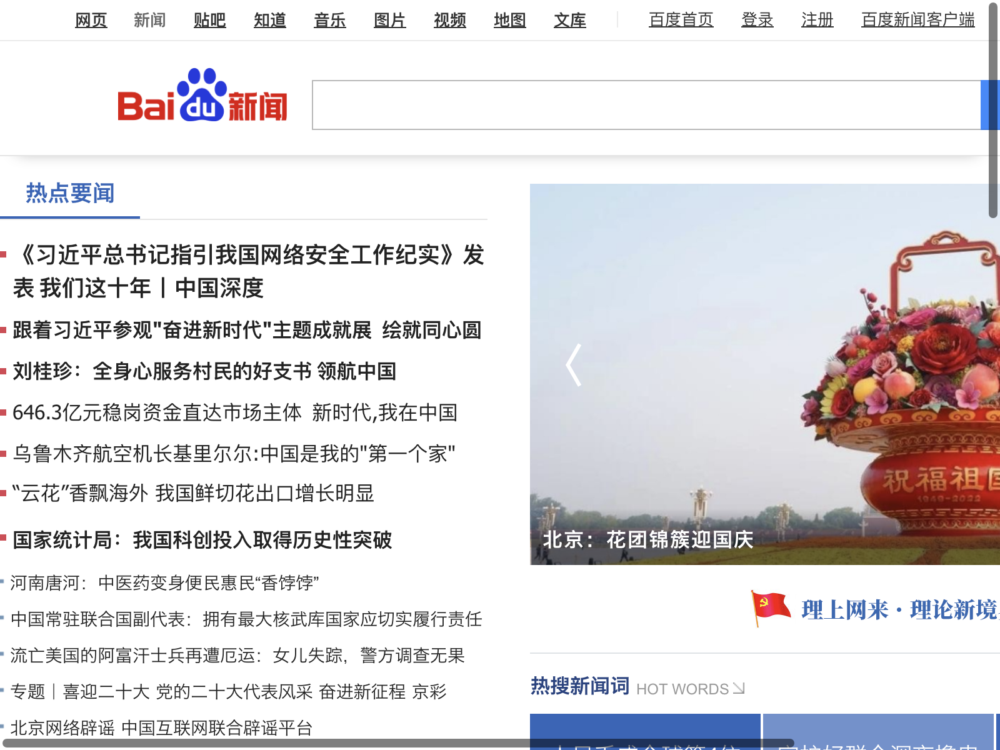

In [126]:
Image("screenshot_google.png",width=800)

##### 通过Link Text定位

一些可以点击的链接跳转上面的文字，就是link text

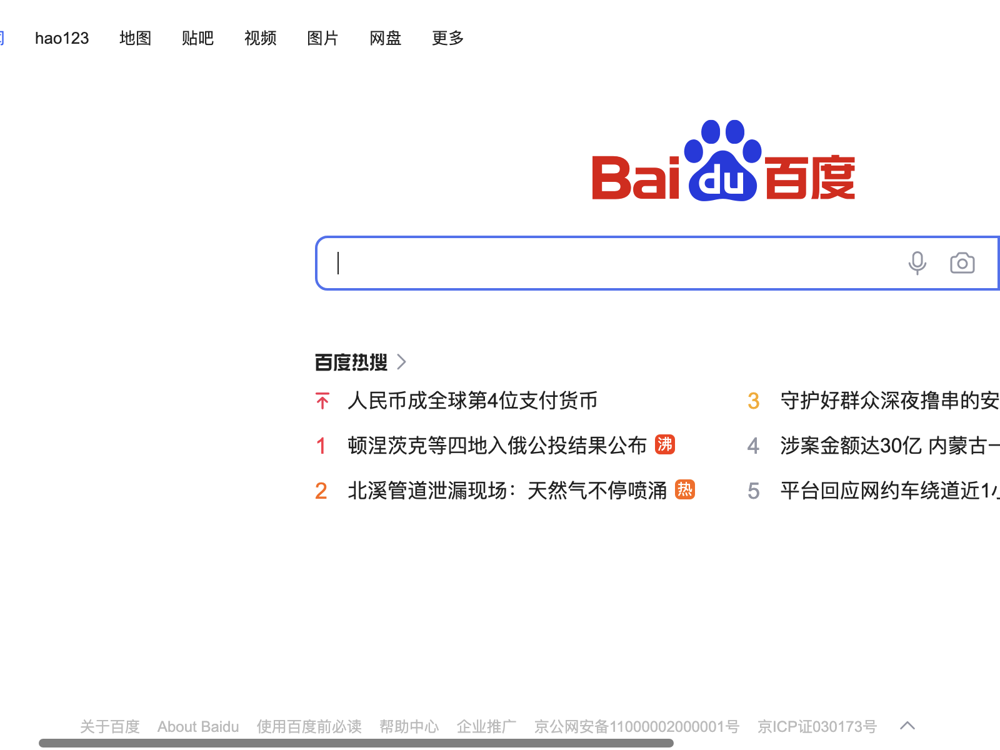

In [127]:
## 加载网页
driver.get("http://www.baidu.com")
## 定位元素，点击
driver.find_element(By.LINK_TEXT,"新闻").click()
driver.save_screenshot('screenshot_google.png')
Image("screenshot_google.png",width=800)

##### 通过Partial Link Text定位

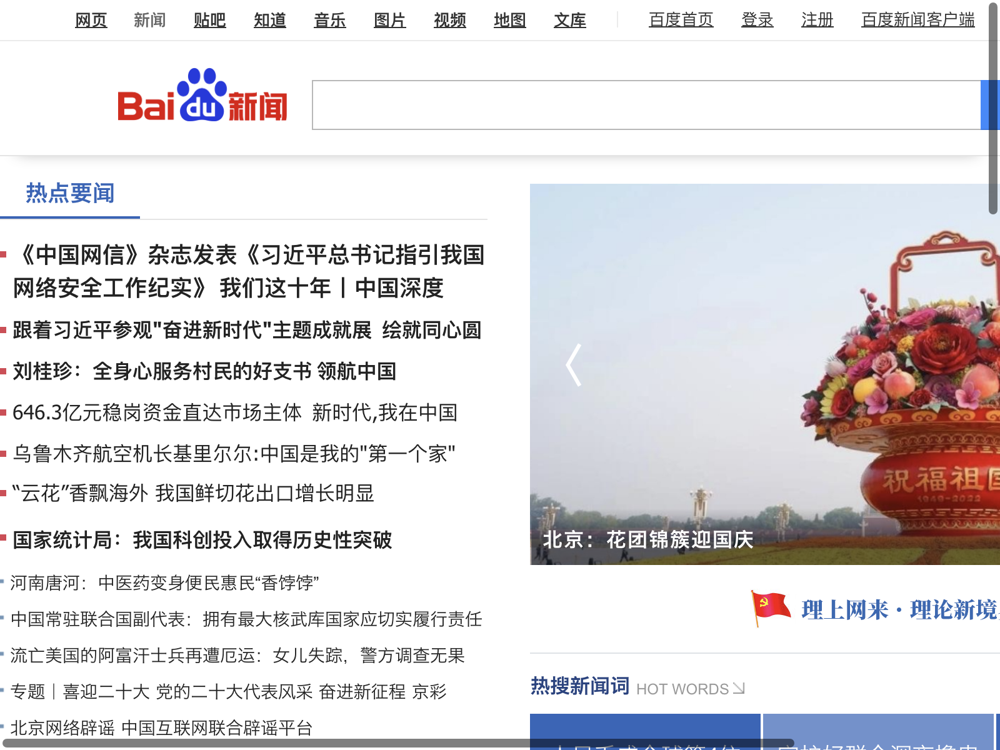

In [128]:
## 加载网页
driver.get("http://www.baidu.com")
## 定位元素，点击
driver.find_element(By.PARTIAL_LINK_TEXT,"新").click()
windows = driver.window_handles
driver.switch_to.window(windows[-1])
driver.save_screenshot('screenshot_google.png')
Image("screenshot_google.png",width=800)

##### 通过tag_name定位

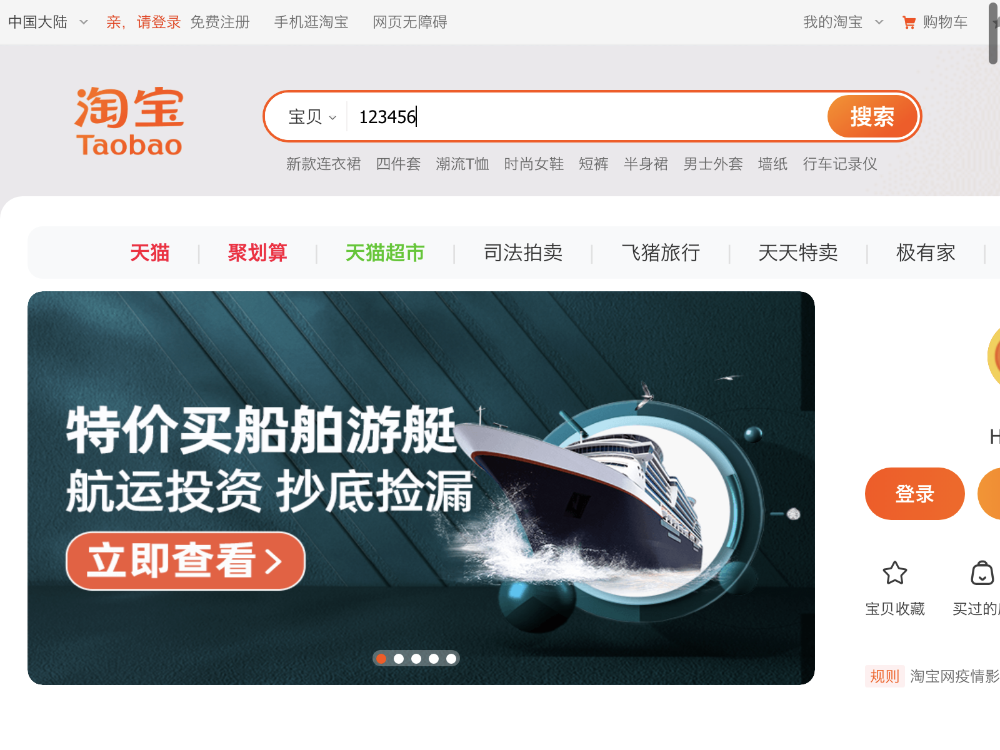

In [129]:
## 加载网页
driver.get('https://www.taobao.com/')
## 定位元素，点击
driver.find_element(By.TAG_NAME ,"input").send_keys('123456')
driver.save_screenshot('screenshot_google.png')
Image("screenshot_google.png",width=800)

#### 通过css_selector定位元素

1. 根据 id 属性选择元素的语法是，在 id 前面加上一个 "#" 号： #id值
2. 根据 class 属性选择元素的语法是，在 class 值前面加上一个"."： .class值
3. 根据标签选择元素的语法是 ： 标签

例如：
```
#root > .d-none
form>div>input
```

##### 根据子元素与后代元素定位

1. 子元素

    如果 元素2 是 元素1 的 直接子元素， 使用 ">" 作连接符， css selector 选择直接子元素的语法是：

    ```python
    /* 一个层级 */
    元素1 > 元素2
    /* 多个层级 */
    元素1 > 元素2 > 元素3 > 元素4
    ```



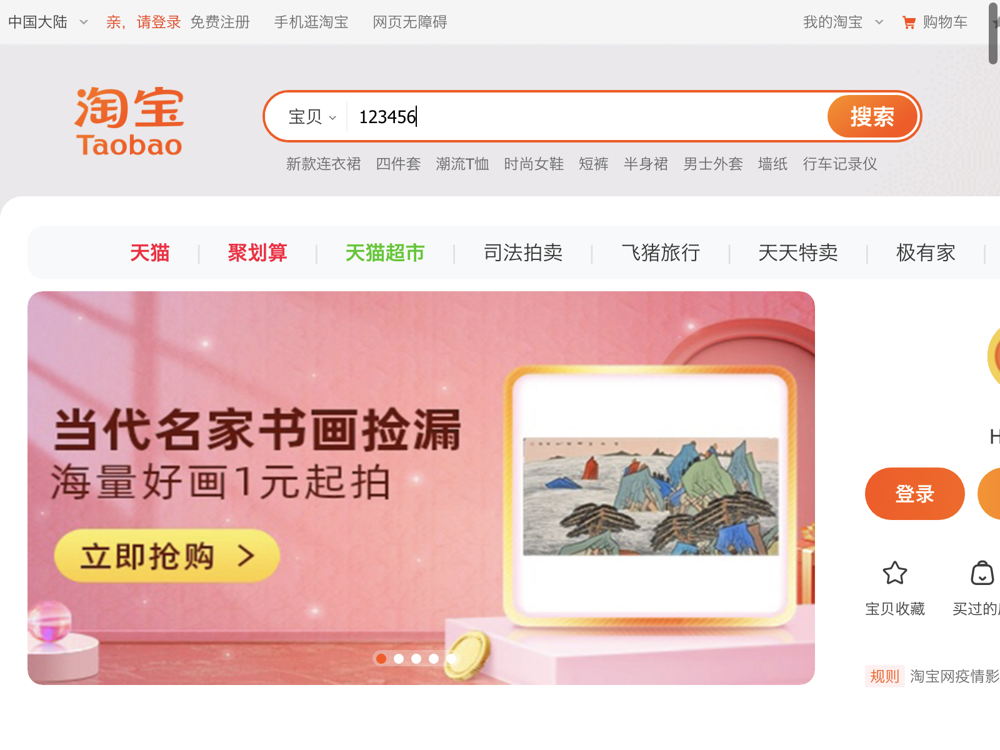

In [130]:
## 加载网页
driver.get('https://www.taobao.com/')
## 定位元素，点击
driver.find_element(By.CSS_SELECTOR ,"form>div>input").send_keys('123456')
driver.save_screenshot('screenshot_google.png')
Image("screenshot_google.png",width=800)

2. 后代元素

    如果元素2是元素1的后代元素（后代元素包含子元素），通过空格隔开元素即可， css selector 选择后代元素的语法是:

    ```python
    /* 一个层级 */
    元素1 元素2
    /* 多个层级 */
    元素1 元素2 元素3 元素4
    ```

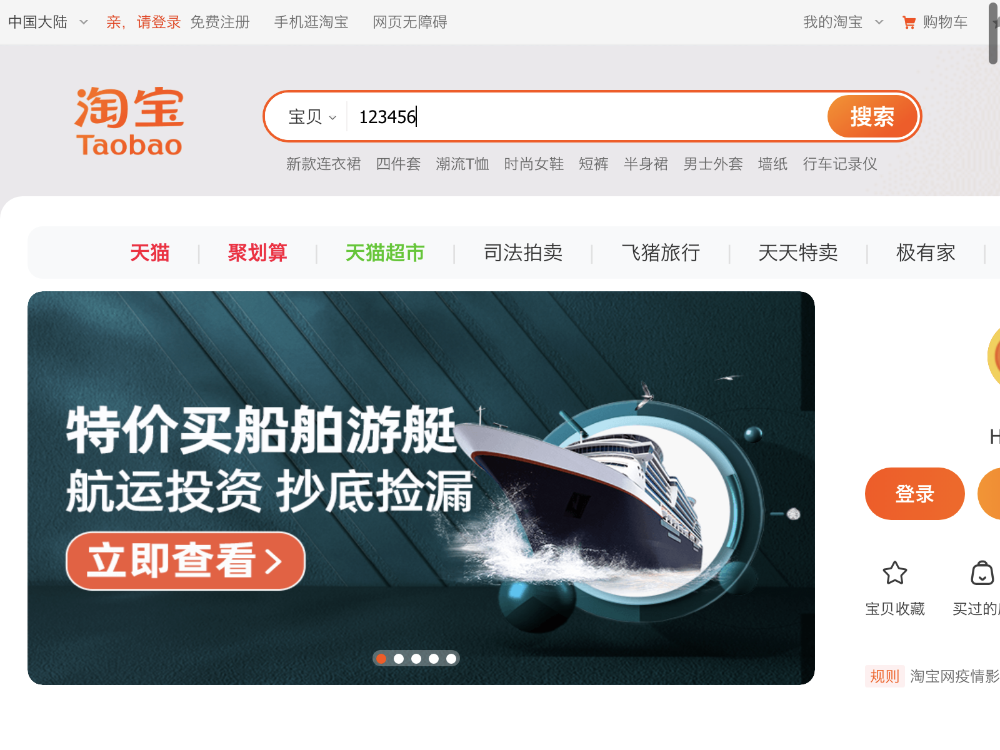

In [131]:
## 加载网页
driver.get('https://www.taobao.com/')
## 定位元素，点击
driver.find_element(By.CSS_SELECTOR ,"form input").send_keys('123456')
driver.save_screenshot('screenshot_google.png')
Image("screenshot_google.png",width=800)

3. 弟弟节点
    ```python
    element + element
    element ~ element ## 需要使用find_elements，否则也只能定位到一个元素
    ```

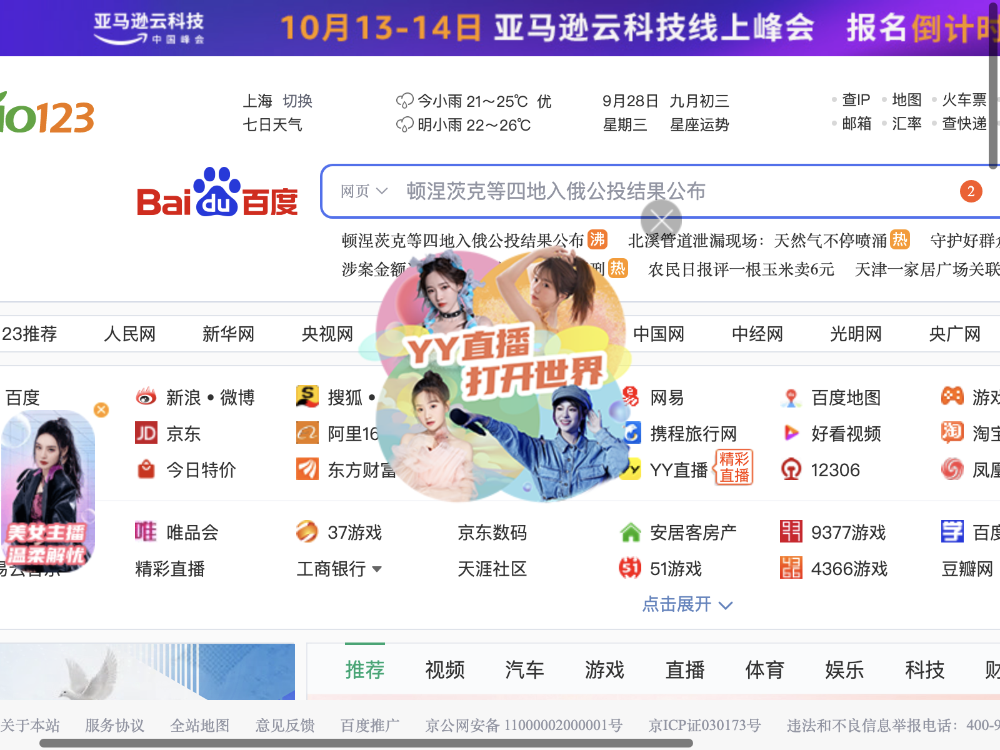

In [132]:
## 加载网页
driver.get("http://www.baidu.com")
## 定位元素，点击
driver.find_element(By.CSS_SELECTOR,'body>div div[id="s-top-left"]>a+a').click()
windows = driver.window_handles
driver.switch_to.window(windows[-1])
driver.save_screenshot('screenshot_google.png')
Image("screenshot_google.png",width=800)

##### 属性定位
支持通过任何属性来选择元素，语法是用一个方括号 []

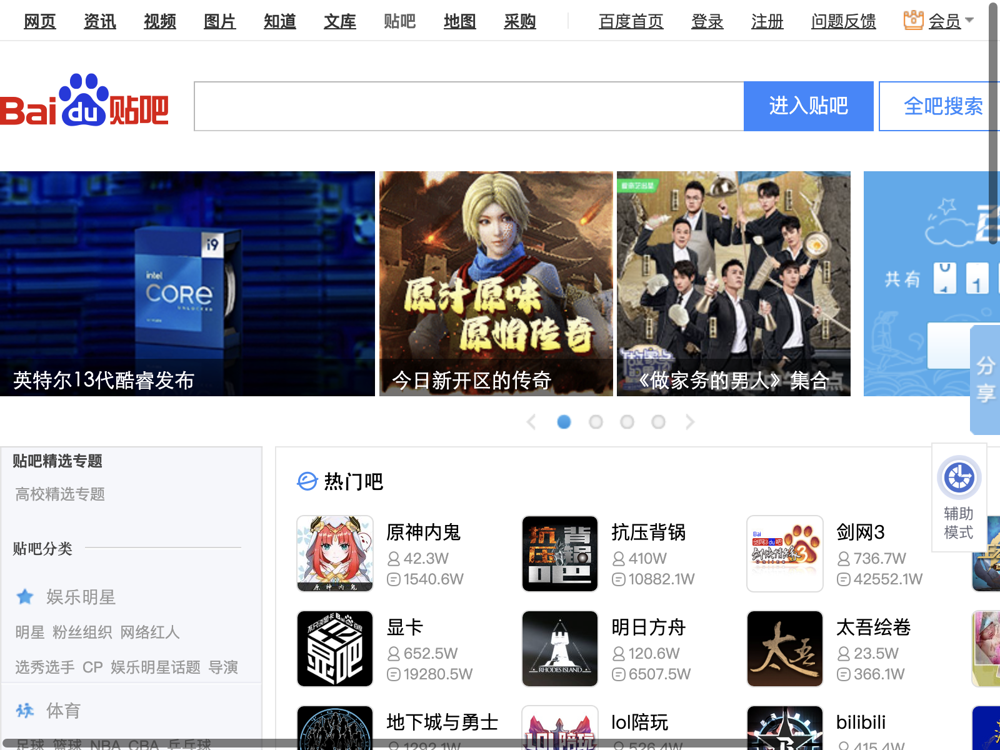

In [133]:
## 加载网页
driver.get("http://www.baidu.com")
## 定位元素，点击
driver.find_element(By.CSS_SELECTOR,'body>div div[id="s-top-left"]>a[href="http://tieba.baidu.com/"]').click()
windows = driver.window_handles
driver.switch_to.window(windows[-1])
driver.save_screenshot('screenshot_google.png')
Image("screenshot_google.png",width=800)

逻辑元素
1. ^= 匹配前缀
    ```python
    [id^='id_prefix_'] # id前缀为‘id_prefix_’的元素
    ```
2. $= 匹配后缀
    ```python
    [id$='_id_sufix'] # id后缀为‘_id_sufix’的元素
    ```
3. *= 包含某个字符串
    ```python
    [id*='id_pattern'] # id包含‘id_pattern’的元素
4. And 
   ```python
    input[name='login'][type='submit']
    ```

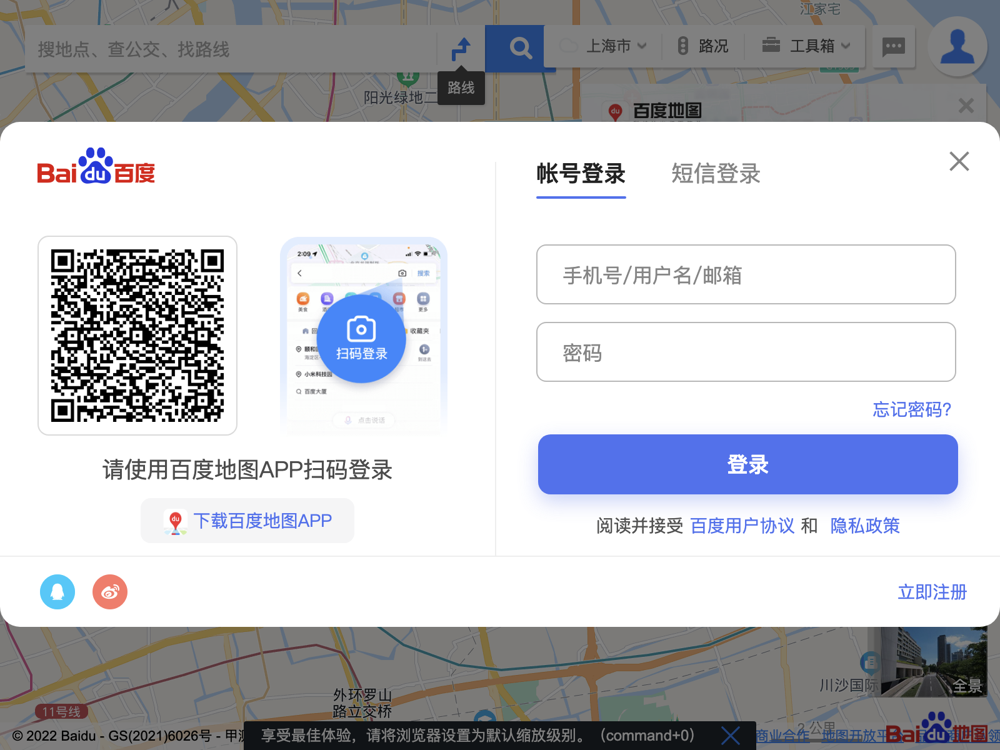

In [134]:
## 加载网页
driver.get("http://www.baidu.com")
## 定位元素，点击
driver.find_element(By.CSS_SELECTOR,'body>div div[id="s-top-left"]>a[href*="//map."]').click()
windows = driver.window_handles
driver.switch_to.window(windows[-1])
driver.save_screenshot('screenshot_google.png')
Image("screenshot_google.png",width=800)

 根据次序选择子节点

1. 父元素的第n个子节点
    
    使用 nth-child(n)，可以指定选择父元素的第几个子节点。
2. 父元素的倒数第n个子节点
    
    使用 nth-last-child(n)，可以倒过来，选择的是父元素的倒数第几个子节点。
3. 父元素的第几个某类型的子节点
    
    使用 nth-of-type(n)，可以指定选择的元素是父元素的第几个某类型的子节点。
4. 父元素的倒数第几个某类型的子节点

    使用 nth-last-of-type(n)，可以倒过来， 选择父元素的倒数第几个某类型的子节点。
5. 奇数节点和偶数节点
   
    如果要选择的是父元素的偶数节点，使用 nth-child(even)
    如果要选择的是父元素的奇数节点，使用 nth-child(odd)
    如果要选择的是父元素的某类型偶数节点，使用 nth-of-type(even)

注意：nth-of-type(even)会先寻找出该路径下所有type类型节点，而后再去取出偶数节点，nth-child则是会取出所有节点，而后判断是否某个节点既符合类型要求，又是偶数节点。

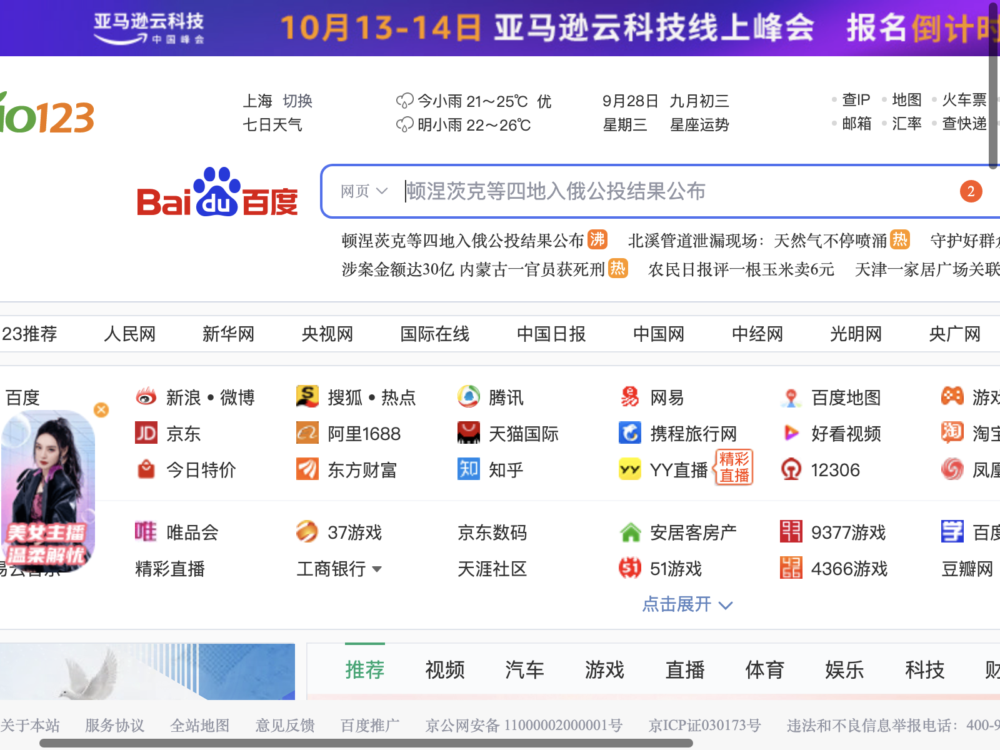

In [135]:
## 加载网页
driver.get("http://www.baidu.com")
## 定位元素，点击
driver.find_element(By.CSS_SELECTOR,'body>div div[id="s-top-left"]>a:nth-of-type(even)').click()
windows = driver.window_handles
driver.switch_to.window(windows[-1])
driver.save_screenshot('screenshot_google.png')
Image("screenshot_google.png",width=800)

#### 通过 Xpath定位
##### 根据子元素与后代元素定位

1. 儿子路径（绝对路径）

    如果某个XPath表达式可以定位到多个元素标签，可以通过(xpath表达式)[index] 定位第index个元素，index索引从1开始。

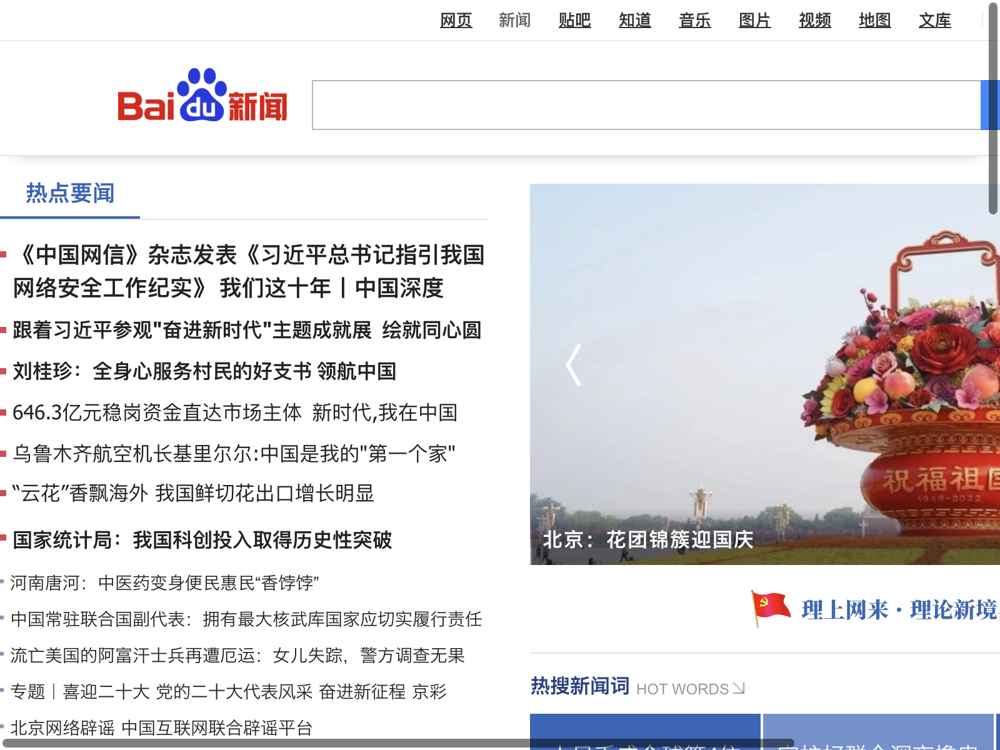

In [136]:
## 加载网页
driver.get("http://www.baidu.com")
## 定位元素，点击
driver.find_element(By.XPATH,"//body/div[1]/div[1]/div[3]/a[1]").click()
windows = driver.window_handles
driver.switch_to.window(windows[-1])
driver.save_screenshot('screenshot_google.png')
Image("screenshot_google.png",width=800)

2. 子孙路径（相对路径）

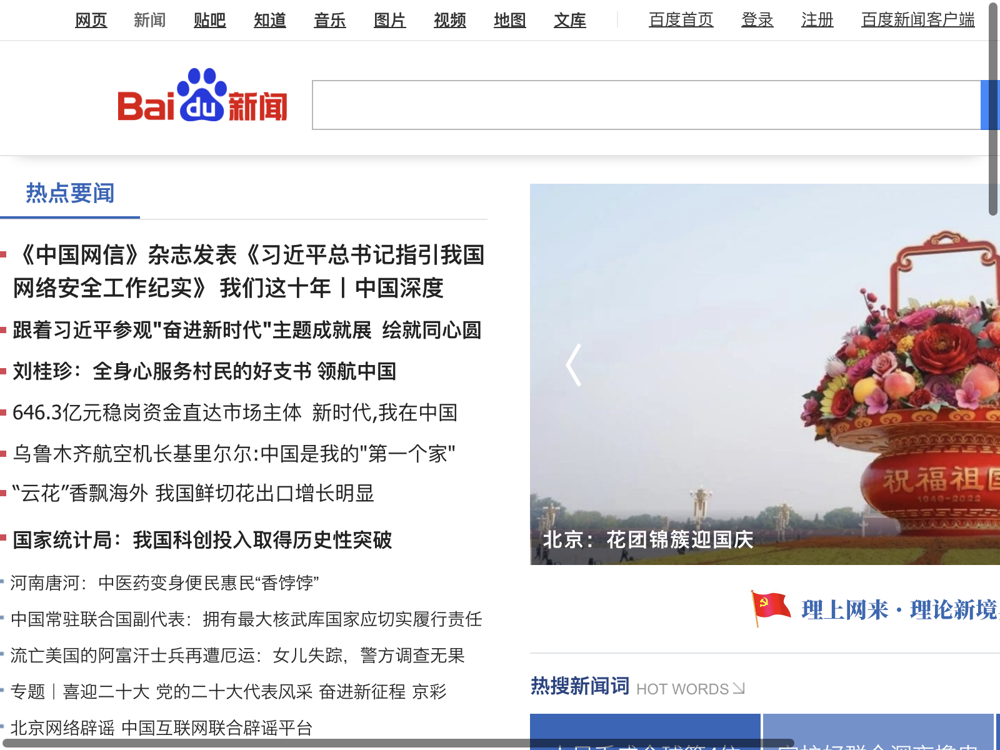

In [137]:
## 加载网页
driver.get("http://www.baidu.com")
## 定位元素，点击
driver.find_element(By.XPATH,"//body//div[3]/a[1]").click()
windows = driver.window_handles
driver.switch_to.window(windows[-1])
driver.save_screenshot('screenshot_google.png')
Image("screenshot_google.png",width=800)

3. 兄弟层级

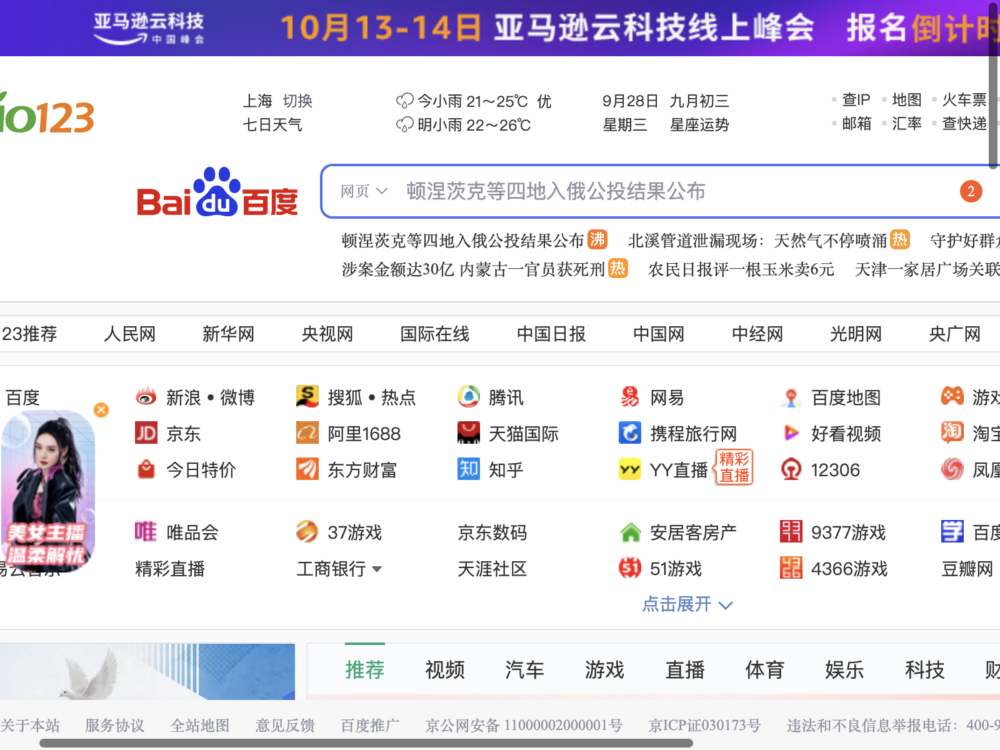

In [138]:
## 加载网页
driver.get("http://www.baidu.com")
## 定位元素，点击
driver.find_element(By.XPATH,"//body//div[3]/a[1]/following-sibling::a").click()
windows = driver.window_handles
driver.switch_to.window(windows[-1])
driver.save_screenshot('screenshot_google.png')
Image("screenshot_google.png",width=800)

4. 父爷层级

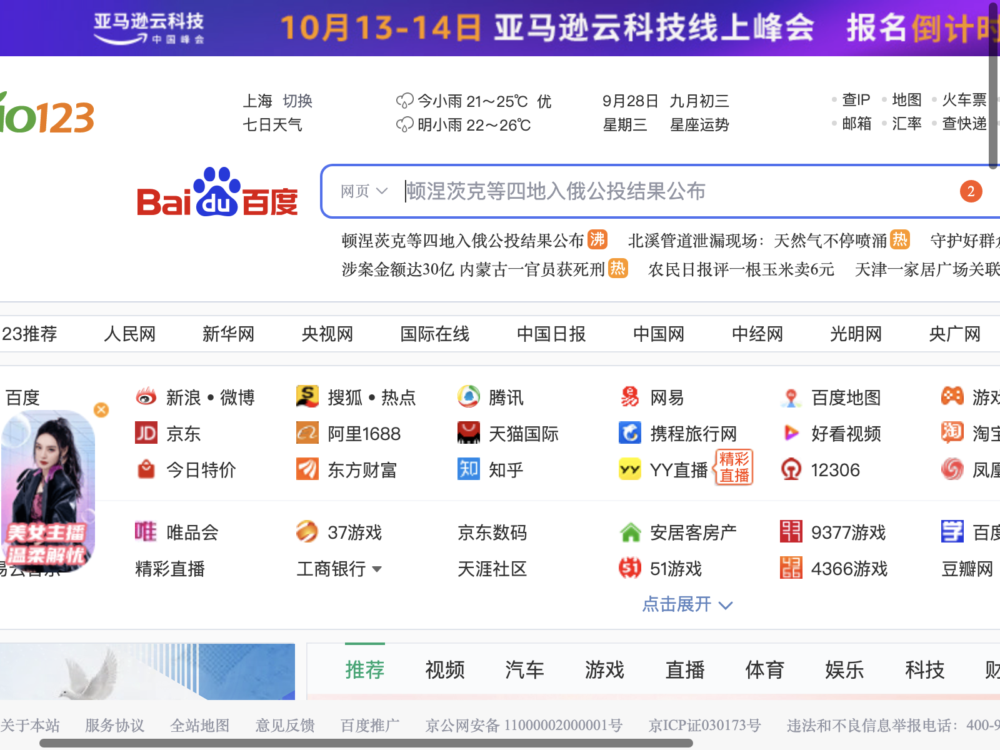

In [139]:
## 加载网页
driver.get("http://www.baidu.com")
## 定位元素，点击
driver.find_element(By.XPATH,"//body//div[3]/a[2]/../a[2]").click()
windows = driver.window_handles
driver.switch_to.window(windows[-1])
driver.save_screenshot('screenshot_google.png')
Image("screenshot_google.png",width=800)

##### 属性值定位

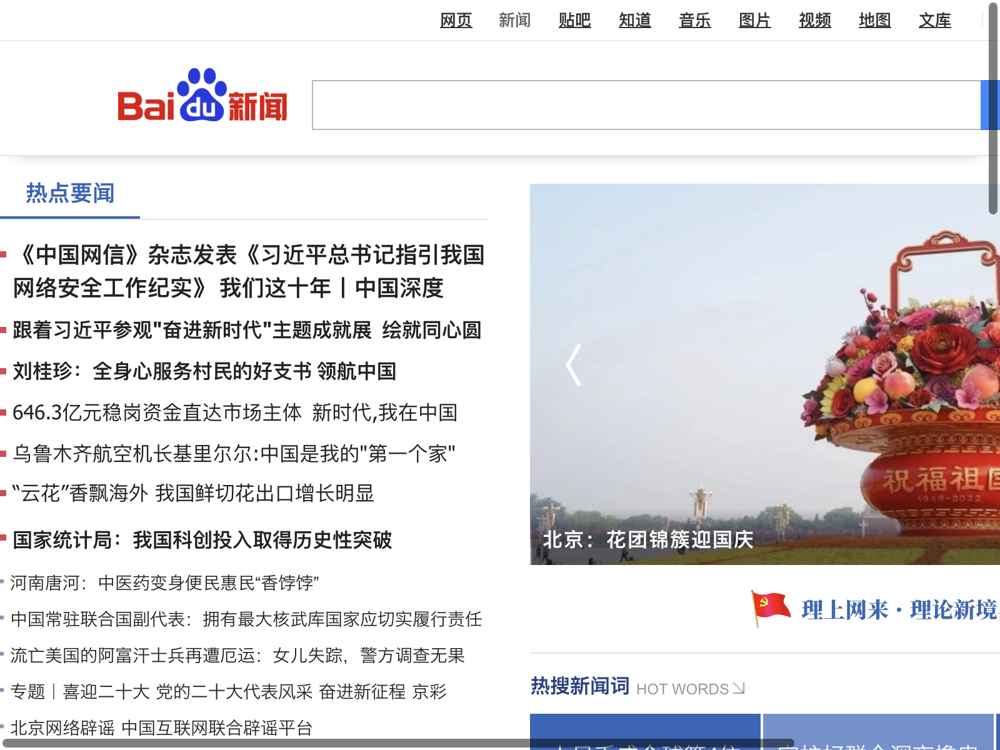

In [140]:
## 加载网页
driver.get("http://www.baidu.com")
## 定位元素，点击
driver.find_element(By.XPATH,"//body//div[3]/a[@href='http://news.baidu.com']").click()
windows = driver.window_handles
driver.switch_to.window(windows[-1])
driver.save_screenshot('screenshot_google.png')
Image("screenshot_google.png",width=800)

##### 逻辑元素

Xpath可以使用 ‘and’ 或者 ‘or’ 连接两个属性1. 
```python
//input[@name='login'and @type='submit']
```

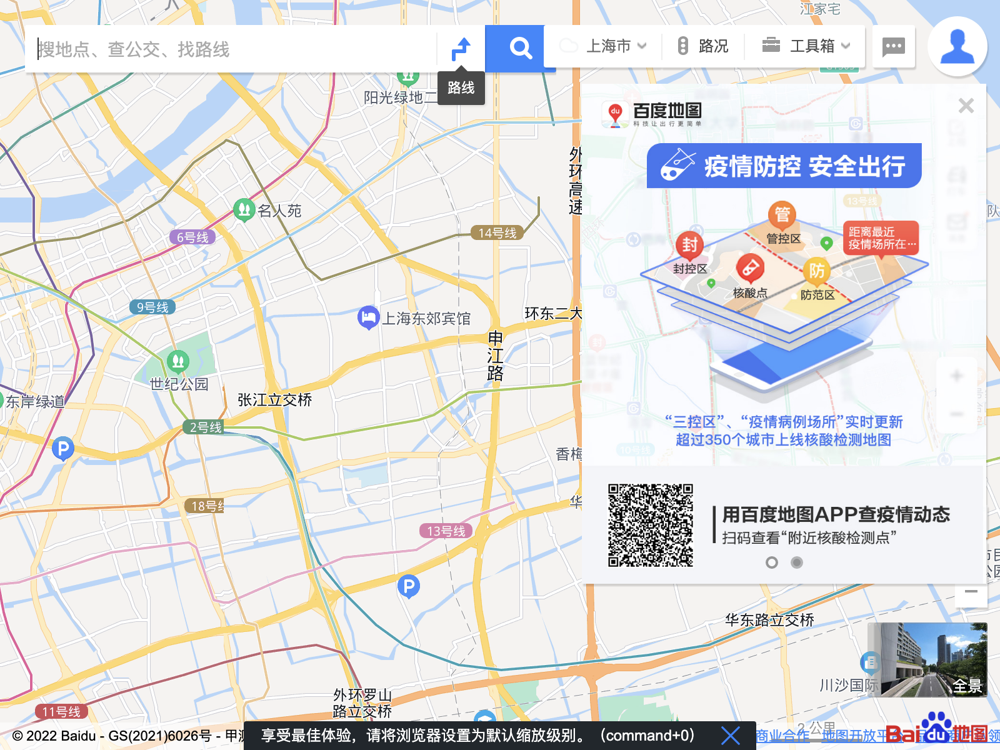

In [141]:
## 加载网页
driver.get("http://www.baidu.com")
## 定位元素，点击
driver.find_element(By.XPATH,"//body//div[3]/a[@target='_blank' and @class='mnav c-font-normal c-color-t'][3] ").click()
windows = driver.window_handles
driver.switch_to.window(windows[-1])
driver.save_screenshot('screenshot_google.png')
Image("screenshot_google.png",width=800)

##### Xpath Text()方法
```python
Xpath = //*[text()='text_value']   
```

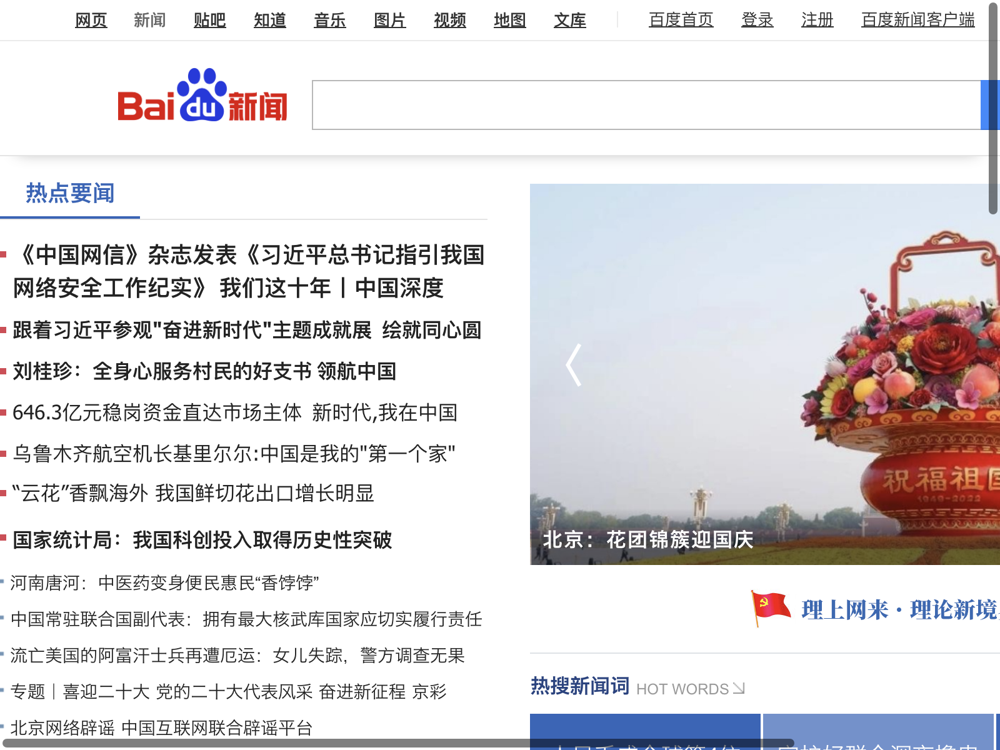

In [142]:
## 加载网页
driver.get("http://www.baidu.com")
## 定位元素，点击
driver.find_element(By.XPATH,"//body//div[3]/a[text()='新闻']").click()
windows = driver.window_handles
driver.switch_to.window(windows[-1])
driver.save_screenshot('screenshot_google.png')
Image("screenshot_google.png",width=800)

##### Xpath Contains()方法

```python
Xpath = //*[contains(@type,'partial_text')]
Xpath = //*[contains(@name,'partial_text')]
Xpath = //*[contains(@class,'partial_text')]
Xpath = //*[contains(@id,'partial_text')]
Xpath = //*[contains(text(),'partial_text')]
Xpath = //*[contains(@href,'partial_text')]
```

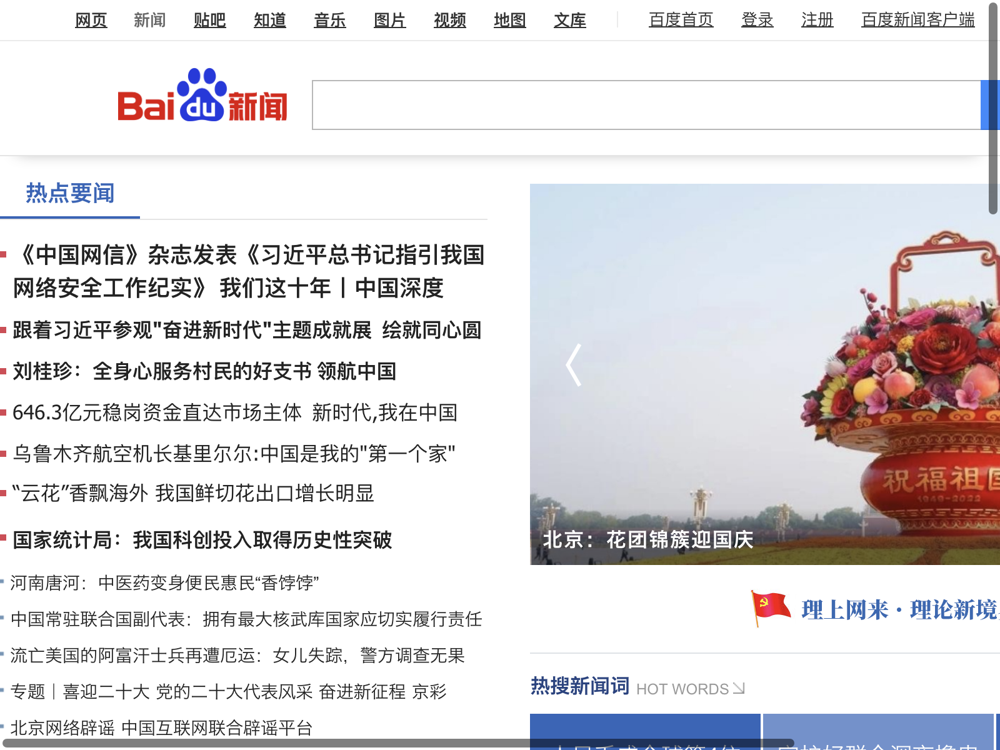

In [143]:
## 加载网页
driver.get("http://www.baidu.com")
## 定位元素，点击
driver.find_element(By.XPATH,"//body//div[3]/a[contains(text(),'新')]").click()
windows = driver.window_handles
driver.switch_to.window(windows[-1])
driver.save_screenshot('screenshot_google.png')
Image("screenshot_google.png",width=800)

##### Xpath Starts-with()方法
```python
Xpath = //*[starts-with(@type,'start_text')]
Xpath = //*[starts-with(@name,'start_text')]
Xpath = //*[starts-with(@class,'start_text')]
Xpath = //*[starts-with(@id,'start_text')]
Xpath = //*[starts-with(text(),'start_text')]
Xpath = //*[starts-with(@href,'start_text')]
```

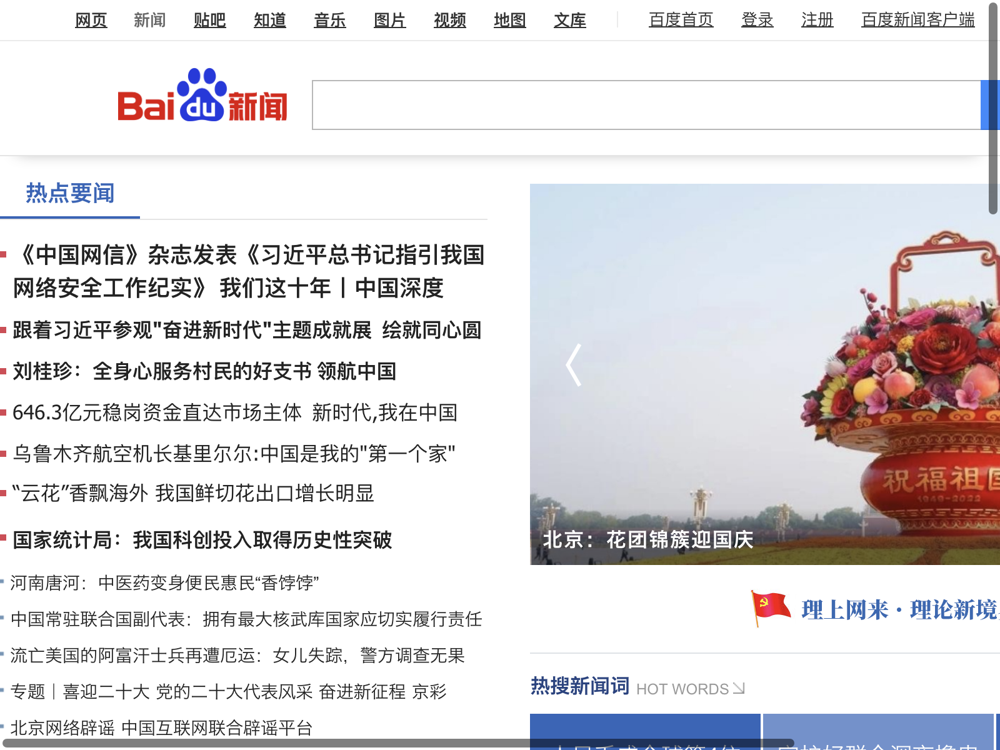

In [144]:
## 加载网页
driver.get("http://www.baidu.com")
## 定位元素，点击
driver.find_element(By.XPATH,"//body//div[3]/a[starts-with(text(),'新')]").click()
windows = driver.window_handles
driver.switch_to.window(windows[-1])
driver.save_screenshot('screenshot_google.png')
Image("screenshot_google.png",width=800)

---

## Selenium动作和等待

In [145]:
options = Options()
# options.add_argument('--headless')
options.add_argument('--no-sandbox')
options.add_argument('--disable-gpu')
driver = webdriver.Chrome(options=options)

### 通过ActionChains传递动作

In [146]:
from selenium.webdriver.common.action_chains import ActionChains
actChain=ActionChains(driver)

#### 模拟⿏标和键盘输⼊

```python
click(on_element=None)                 #鼠标左键单击
click_and_hold(on_element=None)        #单击鼠标左键，不松开
context_click(on_element=None)         #单击鼠标右键
double_click(on_element=None)          #双击鼠标左键
drag_and_drop(source,target)           #拖拽到某个元素然后松开
drag_and_drop_by_offset(source,xoffset,yoffset) #拖拽到某个坐标然后松开
key_down(value,element=None)     #按下键盘上的某个键
key_up(value, element=None)      #松开键盘上的某个键
move_by_offset(xoffset, yoffset)  #鼠标从当前位置移动到某个坐标
move_to_element(to_element)        #鼠标移动到某个元素
move_to_element_with_offset(to_element, xoffset, yoffset) #移动到距某个元素（左上角坐标）多少距离的位置
pause(seconds)                  #暂停所有输入(指定持续时间以秒为单位)
perform()                       #执行所有操作
reset_actions()                 #结束已经存在的操作并重置
release(on_element=None)       #在某个元素位置松开鼠标左键
send_keys(*keys_to_send)        #发送某个键或者输入文本到当前焦点的元素
send_keys_to_element(element, *keys_to_send) #发送某个键到指定元素

```
其中```send_keys```和```click```可以直接作为```webelement```的方法使用，也就是可以直接跟在find_element方法之后对元素使用。

一切人通过鼠标、键盘操作的动作它都可以操作

In [147]:
driver.get('https://demoqa.com/droppable/')
drag_element = driver.find_element(By.CSS_SELECTOR,".simple-drop-container #draggable")
drop_element = driver.find_element(By.CSS_SELECTOR,".simple-drop-container .drop-box.ui-droppable")
actChain.click_and_hold(drag_element)
actChain.drag_and_drop(drag_element,drop_element)
actChain.perform()

键入一些特殊键

``` python
send keys(Keys.BACK_SPACE)  ##删除键
send_keys(Keys.SPACE)  ##空格键
send_keys(Keys.TAB)   ##缩进键
send_keys(Keys.ESCAPE)  ## ESC键
send_keys(Keys.ENTER)   ## 回车键
send_keys(Keys.CONTROL,'c')   ## Control键
send_keys(Keys.F1)    ## F键
```

In [152]:
from selenium.webdriver.common.keys import Keys

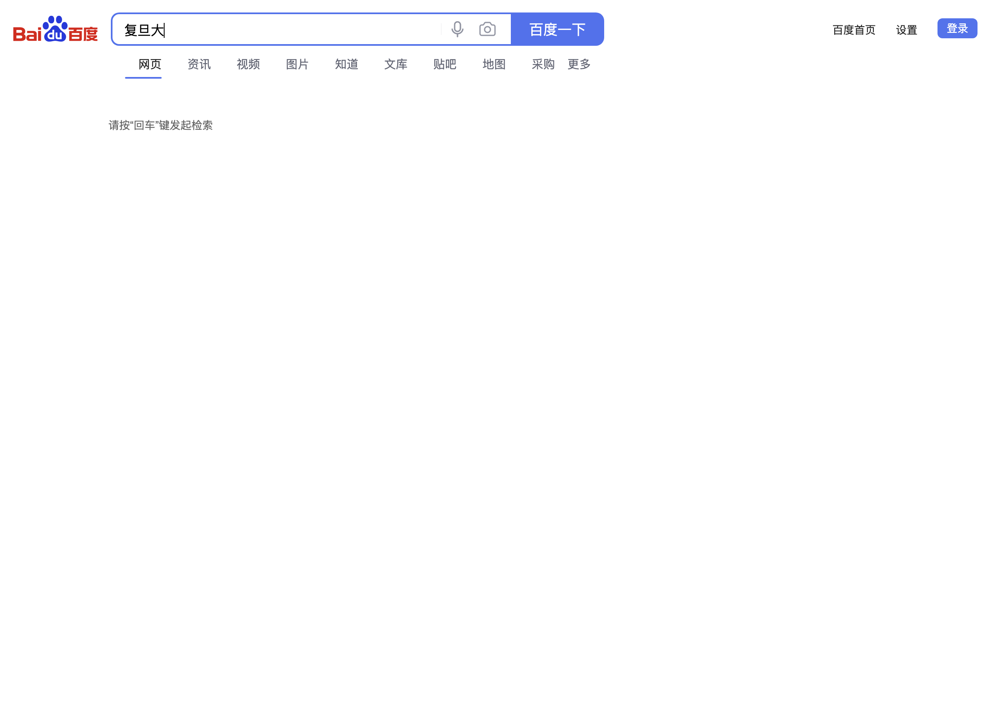

In [153]:
driver.get('https://baidu.com')
driver.find_element(By.NAME,"wd").send_keys("复旦大学")
driver.find_element(By.NAME,"wd").send_keys(Keys.BACK_SPACE)
driver.save_screenshot('screenshot_google.png')
Image("screenshot_google.png",width=800)

### 页面等待

#### sleep 强制等待

简单粗暴，根据网站的响应速度和自己的网速来设置合理的休眠时间


In [155]:
from selenium import webdriver
driver = webdriver.Chrome()  #设置等待2秒钟
driver.get('http://www.baidu.com')
time.sleep(3)
driver.close()

####  implicitly_wait() 隐性等待

设置一个最长等待时间，如果在规定时间内网页加载完成，则执行下一步，否则一直等到时间截止，然后执行下一步，超出设置的时长20秒还没有定位到元素，则抛出异常。

In [156]:
from selenium import webdriver
driver = webdriver.Chrome()  #设置等待2秒钟
driver.get('http://www.baidu.com')
driver.implicitly_wait(4)  
driver.close()

#### WebDriverWait() 显式等待

In [157]:
from selenium.webdriver.support import expected_conditions as EC
from selenium.webdriver.support.ui import WebDriverWait

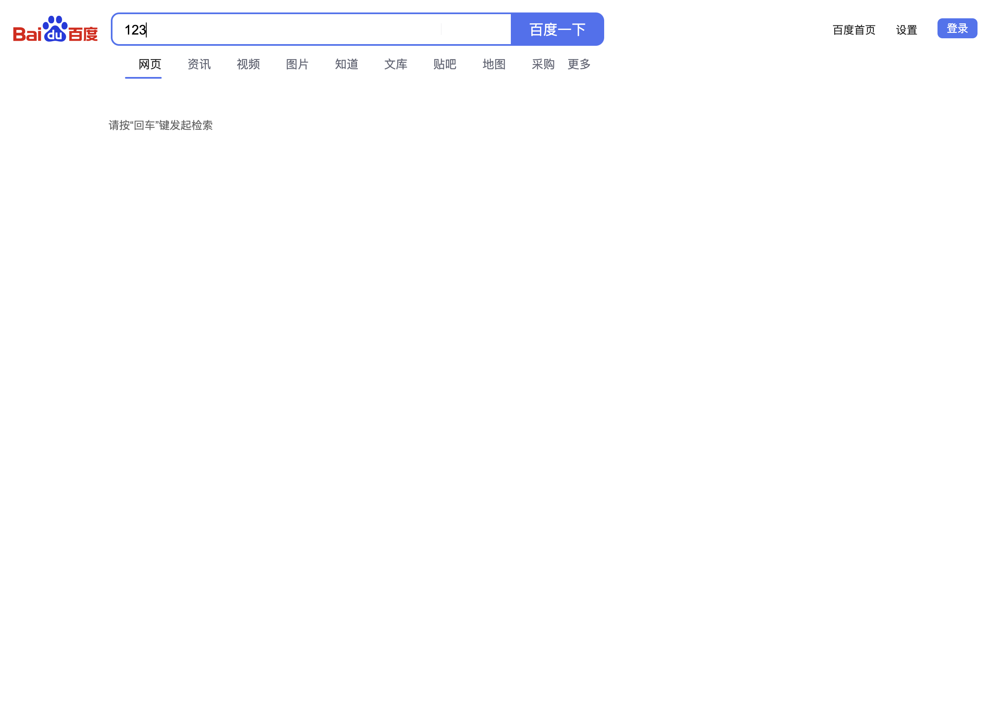

In [162]:
driver = webdriver.Chrome()
driver.get('http://www.baidu.com')
try:
   element = WebDriverWait(driver,10).until(EC.presence_of_element_located((By.ID,'kw')))
   element.send_keys('123')
   driver.save_screenshot('screenshot_google.png')
except Exception as message:
   print('元素定位报错%s'%message)
finally:
   pass
Image("screenshot_google.png",width=800)
driver.close()


## 网页窗口操作

### 网页前进/后退

```python
driver.forward()     #前进
driver.back()        # 后退
```

### 窗口切换

``` python
driver.current_window_handle  ## 目前所在的窗口
driver.window_handles -> List[Str]  ## 所有窗口
driver.switch_to.window   ##切换窗口
```

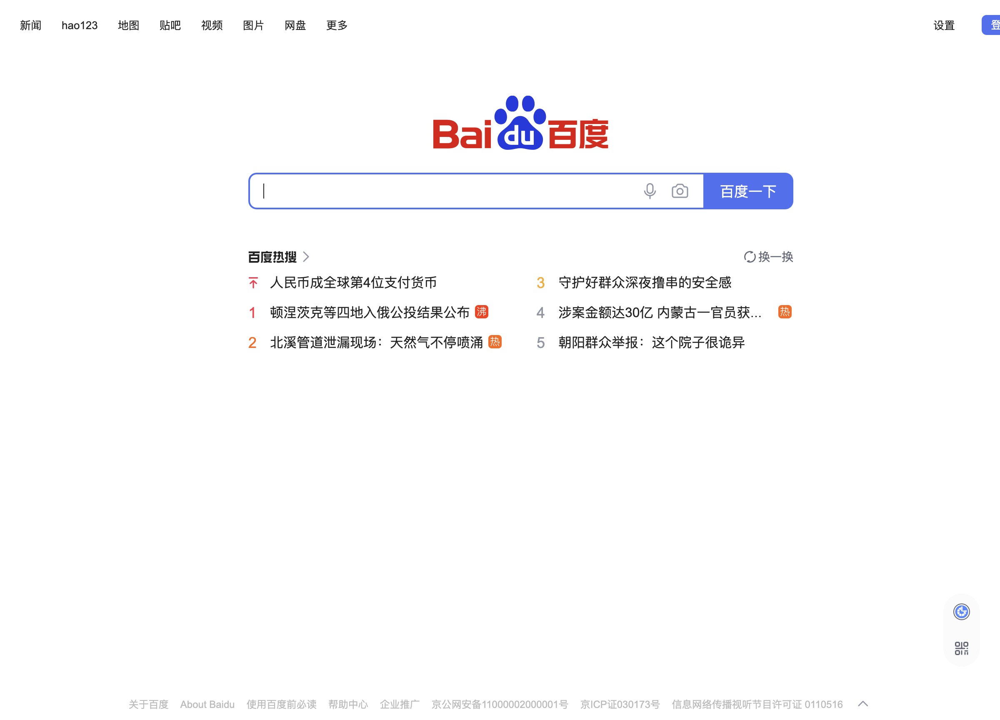

In [166]:
driver = webdriver.Chrome()
## 加载网页
driver.get("http://www.baidu.com")
window_1 = driver.current_window_handle
## 定位元素，点击
driver.find_element(By.XPATH,"//body//div[3]/a[starts-with(text(),'新')]").click()
windows = driver.window_handles
driver.switch_to.window(windows[-1])  ## 找到最新的窗口并切换
driver.switch_to.window(window_1)   ## 退到最早的窗口
driver.save_screenshot('screenshot_google.png')
Image("screenshot_google.png",width=800)

---

## 下拉菜单处理

In [167]:
from selenium.webdriver.support.ui import Select

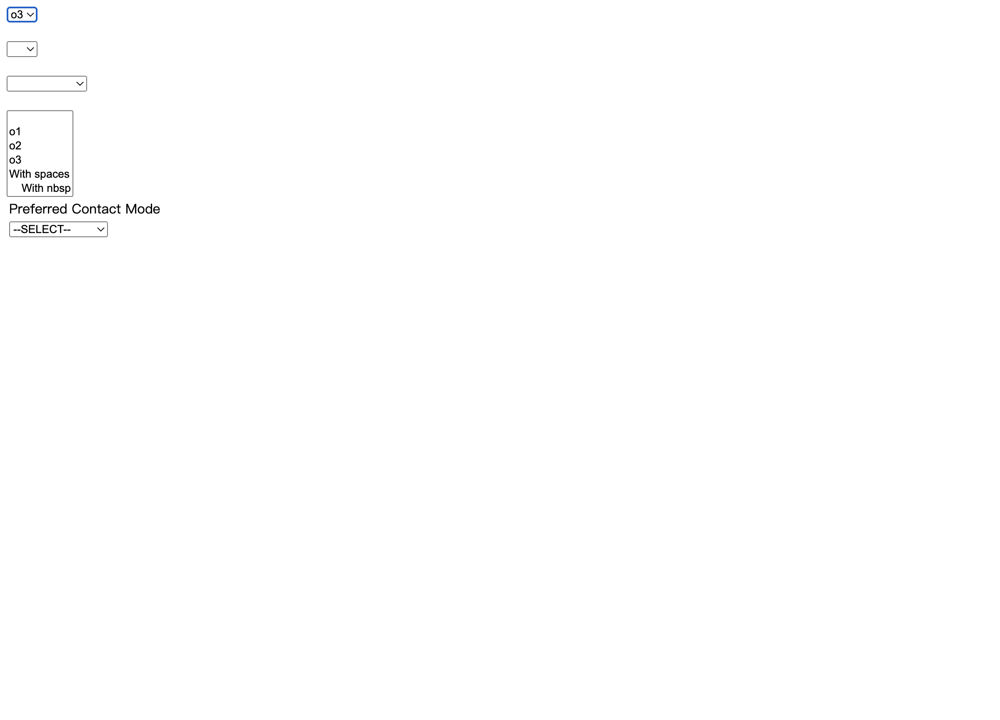

In [173]:
from selenium import webdriver
from selenium.webdriver.support.ui import Select

driver = webdriver.Chrome()
driver.get('http://sahitest.com/demo/selectTest.htm')

s1 = Select(driver.find_element(By.ID, 's1Id'))  # 实例化Select

s1.select_by_index(1)  # 选择第二项选项：o1
time.sleep(3)
s1.select_by_value("o2")  # 选择value="o2"的项
time.sleep(3)
s1.select_by_visible_text("o3")  # 选择text="o3"的值，即在下拉时我们可以看到的文本
time.sleep(3)
driver.save_screenshot('screenshot_google.png')
driver.close()
Image("screenshot_google.png",width=800)

---

## 例子(可能需要额外的一些三方库)

### 平安复旦自动填报

请在settings.py中填入相关信息

In [7]:
from selenium import webdriver
from selenium.webdriver.common.by import By 
from selenium.webdriver.support import expected_conditions as EC
from selenium.webdriver.support.ui import WebDriverWait
from aip import AipOcr 
from selenium import webdriver
from settings import *
import time
driver = webdriver.Chrome()
driver.get('https://zlapp.fudan.edu.cn/site/ncov/fudanDaily')
element = WebDriverWait(driver,20).until(EC.presence_of_element_located((By.ID,"username")))
element.send_keys(username)
driver.find_element(By.ID,"password").send_keys(password)
driver.find_element(By.ID,"idcheckloginbtn").click()

element = WebDriverWait(driver,20).until(EC.presence_of_element_located((By.CSS_SELECTOR,".wapat-btn.wapat-btn-ok")))
element.click()
driver.find_element(By.XPATH,"/html/body/div[1]/div/div[1]/section/div[4]/ul/li[4]/div/div/div[1]/span[1]").click()
driver.find_element(By.XPATH,"/html/body/div[1]/div/div[1]/section/div[4]/ul/li[6]/div/input").click()
time.sleep(15)

driver.find_element(By.PARTIAL_LINK_TEXT,"提交信息").click()
    

driver.find_element(By.CSS_SELECTOR,".wapcf-btn.wapcf-btn-ok").click()
img = driver.find_element(By.XPATH,"/html/body/div[1]/div/div[3]/div/div[2]/img")
time.sleep(1)
data = img.screenshot_as_png   ## 获取base64


client = AipOcr(APP_ID, API_KEY, SECRET_KEY)

res = client.basicGeneral(data, {})
res_word = res['words_result'][0]['words'].rstrip().replace(' ','')

driver.find_element(By.XPATH,"/html/body/div[1]/div/div[3]/div/div[1]/input").send_keys(res_word)
driver.find_element(By.XPATH,"/html/body/div[1]/div/div[3]/div/div[3]/div").click()

# driver.close()

### 爬取最近的招股说明书
科创板：https://kcb.sse.com.cn/renewal/

创业板：http://listing.szse.cn/projectdynamic/ipo/index.html

In [3]:
!python md.py

---  正在获取创业板ipo数据  ---
永兴东润服饰股份有限公司.pdf 处理完成第2页
北京航天和兴科技股份有限公司.pdf 处理完成第2页
华南新海（深圳）科技股份有限公司.pdf 处理完成第2页
 ---  正在获取创业板ref数据  ---
---  正在获取创业板rep数据  ---
---  正在获取科创板数据  ---

---  正在获取新发行股票  ---
---  正在输出公司信息  ---
---  开始进行文件输入  ---
